# Exploratory Data Analysis 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder

In [2]:
# Load Dataset
df = pd.read_csv("C:\Tele Comunication Project\Churn.csv")


In [3]:
# Display initial dataset information
print("Initial Data Info:")
df.info()
print("\nMissing Values:")
print(df.isnull().sum())

Initial Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls   

In [4]:
# Remove Unnecessary Columns
df.drop(columns=["Unnamed: 0", "state"], inplace=True)

In [5]:
# Convert Data Types
df["day.charge"] = pd.to_numeric(df["day.charge"], errors='coerce')
df["eve.mins"] = pd.to_numeric(df["eve.mins"], errors='coerce')

In [6]:
# Fill Missing Values with Median
df.fillna(df.median(numeric_only=True), inplace=True)


In [7]:
# Encode Categorical Variables
le = LabelEncoder()
df["churn"] = le.fit_transform(df["churn"])
df["voice.plan"] = le.fit_transform(df["voice.plan"])
df["intl.plan"] = le.fit_transform(df["intl.plan"])
df["area.code"] = le.fit_transform(df["area.code"])

In [8]:
# Display cleaned dataset information
print("\nCleaned Data Info:")
df.info()


Cleaned Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   area.code       5000 non-null   int32  
 1   account.length  5000 non-null   int64  
 2   voice.plan      5000 non-null   int32  
 3   voice.messages  5000 non-null   int64  
 4   intl.plan       5000 non-null   int32  
 5   intl.mins       5000 non-null   float64
 6   intl.calls      5000 non-null   int64  
 7   intl.charge     5000 non-null   float64
 8   day.mins        5000 non-null   float64
 9   day.calls       5000 non-null   int64  
 10  day.charge      5000 non-null   float64
 11  eve.mins        5000 non-null   float64
 12  eve.calls       5000 non-null   int64  
 13  eve.charge      5000 non-null   float64
 14  night.mins      5000 non-null   float64
 15  night.calls     5000 non-null   int64  
 16  night.charge    5000 non-null   float64
 17  customer.call

cleaned dataset is ready with 19 columns and 5000 entries, all properly formatted and without missing values. This is an excellent foundation for starting the model building process to predict customer churn.

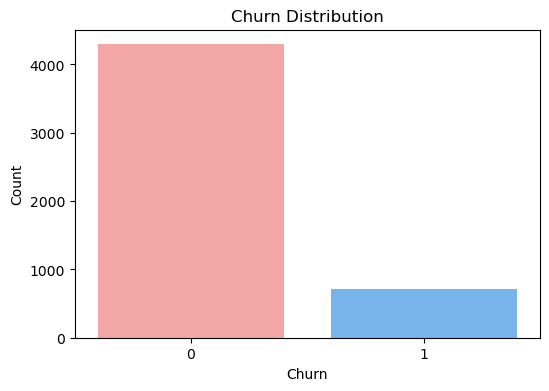

In [9]:
# Visualization - Churn Distribution
plt.figure(figsize=(6, 4))
sns.countplot(x=df["churn"], palette=["#FF9999", "#66B3FF"])
plt.title("Churn Distribution")
plt.xlabel("Churn")
plt.ylabel("Count")
plt.show()

The 'Churn Distribution' chart shows a significant imbalance between customers who have churned and those who haven't, with far more customers not churning. This imbalance could lead to biased predictions favoring the majority class in machine learning models, suggesting the need for techniques to address this issue in your model training process.

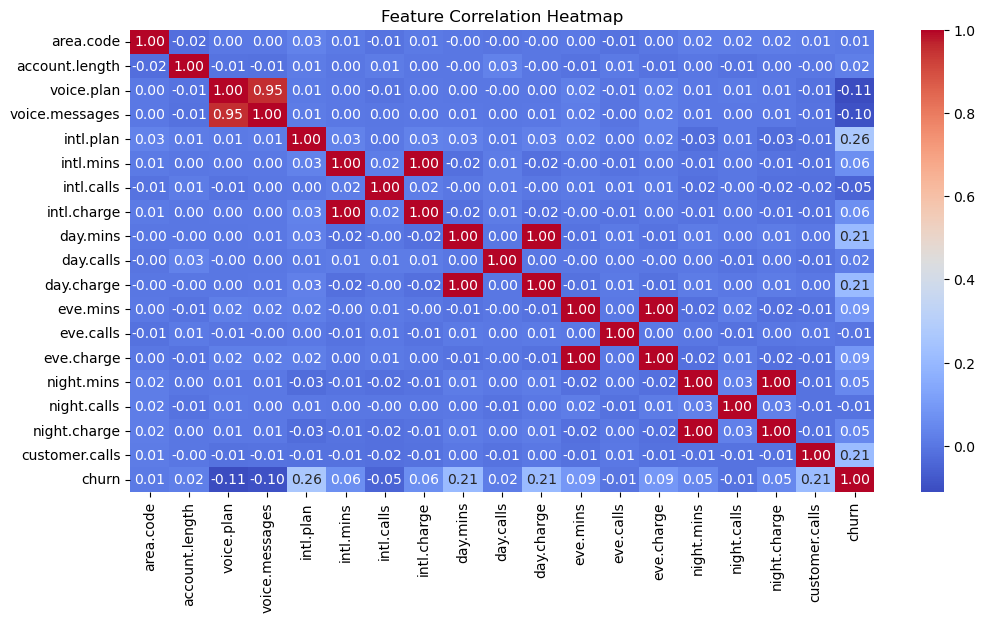

In [10]:
# Correlation Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df.select_dtypes(include=['number']).corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


The **Feature Correlation Heatmap** shows that most features are not strongly correlated with the target variable `churn`, which indicates no single feature strongly predicts churn on its own. However, certain features like `voice.plan` and `voice.messages` are highly correlated with each other, suggesting redundancy that may not require both features in model building.

Additionally, the features `intl.mins`, `intl.calls`, and `intl.charge` show some degree of correlation with each other, suggesting a relationship between international usage metrics.

Overall, this heatmap suggests that model building should consider reducing feature redundancy and focusing on combining features effectively to predict churn.

C:\Users\misha\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


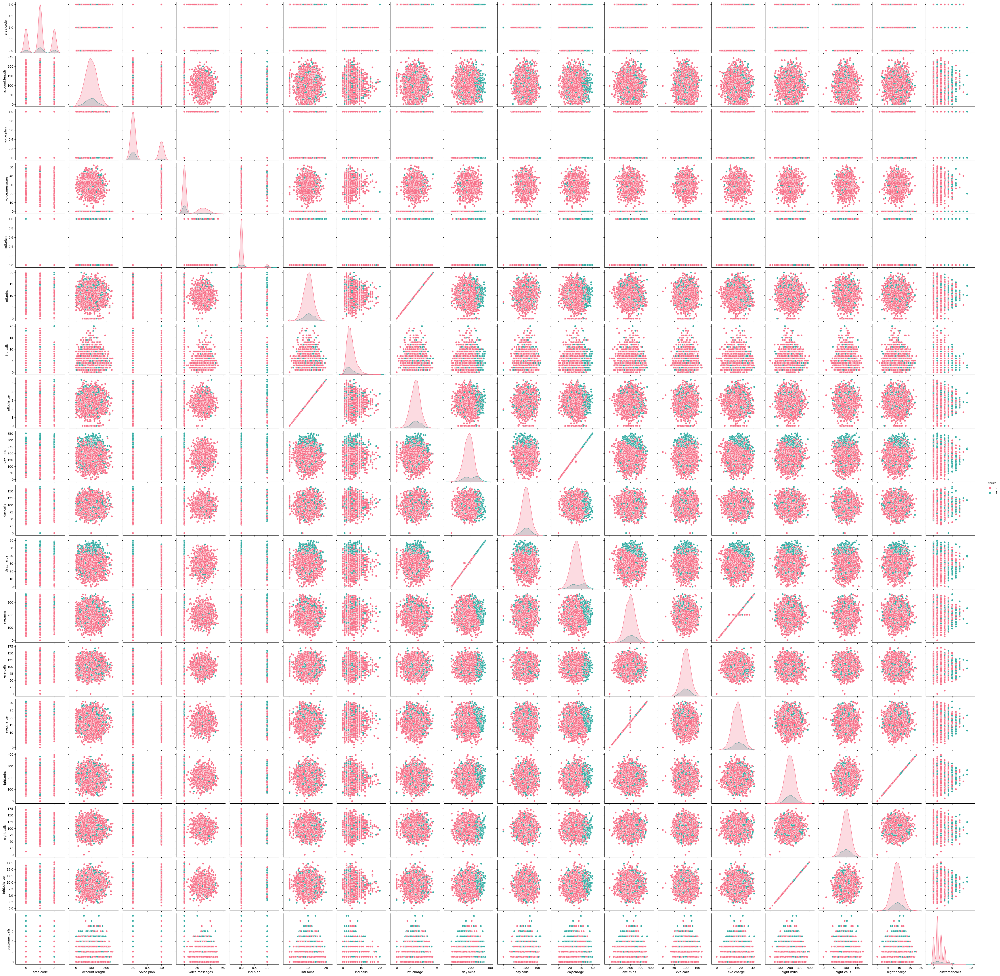

In [11]:
# Pairplot for Key Features
sns.pairplot(df, hue="churn", diag_kind="kde", palette="husl")
plt.show()

The **pairplot** visualizes relationships between all features in the dataset, differentiated by churn (`0` for no churn, `1` for churn). This plot reveals:

- **Distributions of each feature**, shown along the diagonal.
- **Scatter plots for feature combinations** in the off-diagonal plots, indicating relationships between pairs of features.

From this, you can see which features have distinct distributions or relationships when considering churn, providing useful insights for feature selection and model building. Look for plots with clear separations between the churn categories to identify potential predictors.

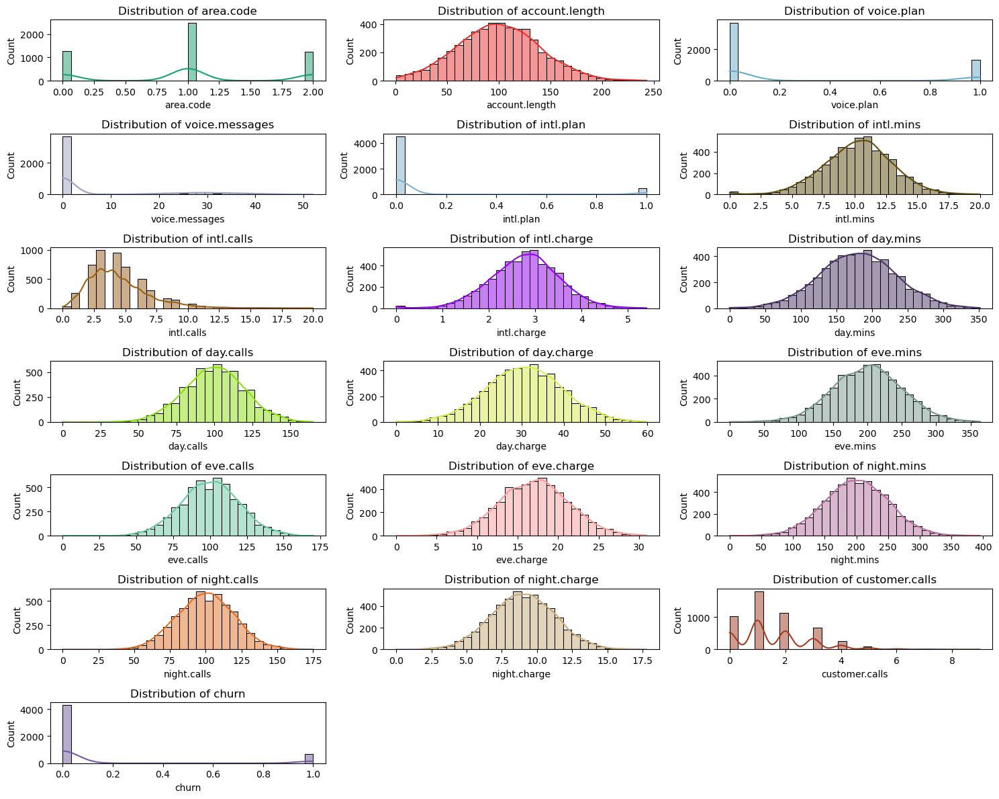

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Select numeric columns
num_features = df.select_dtypes(include=["number"]).columns

# Determine the number of rows and columns
ncols = 3
nrows = math.ceil(len(num_features) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 12))
axes = axes.flatten()  # Flatten to iterate easily

for i, col in enumerate(num_features):
    sns.histplot(df[col], kde=True, bins=30, ax=axes[i], color=np.random.rand(3,).tolist())
    axes[i].set_title(f"Distribution of {col}")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Remove extra axes

plt.tight_layout()
plt.show()


The histograms show the distribution of various features in your dataset. Key observations:

- **Skewed Distributions**: Features like `intl.calls`, `customer.calls`, and `voice.messages` are right-skewed.
- **Uniform and Normal Distributions**: `account.length` and `day.mins` appear fairly normally distributed, which is good for many modeling techniques.
- **Binary Features**: `voice.plan`, `intl.plan`, and `churn` are binary and show imbalance, especially visible in the `churn` distribution.

These visual insights help in understanding how different features vary across your dataset and indicate potential transformations or normalization that might be needed before model building.

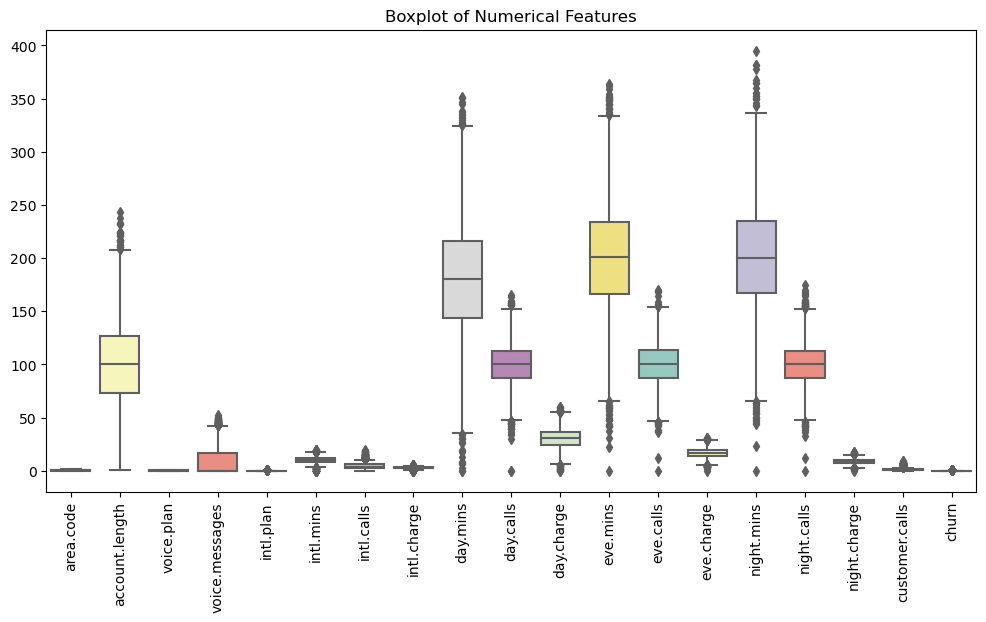

In [13]:
# Boxplot to Identify Outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, palette="Set3")
plt.xticks(rotation=90)
plt.title("Boxplot of Numerical Features")
plt.show()

The boxplot highlights outliers across several numerical features, notably in variables related to call minutes and charges (`day.mins`, `eve.mins`, `night.mins`, `intl.mins`, `day.charge`, `eve.charge`, `night.charge`, `intl.charge`). These outliers may need to be examined or handled to improve model performance and ensure that the training process isn't unduly influenced by extreme values.

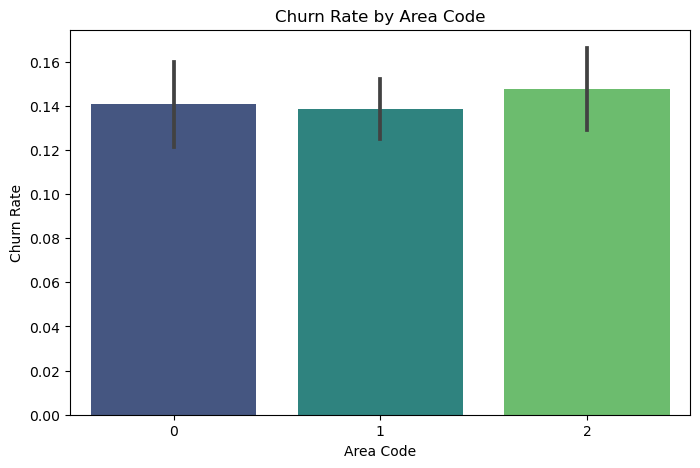

In [14]:
# Churn Rate by Area Code
plt.figure(figsize=(8, 5))
sns.barplot(x=df["area.code"], y=df["churn"], palette="viridis")
plt.title("Churn Rate by Area Code")
plt.xlabel("Area Code")
plt.ylabel("Churn Rate")
plt.show()

The bar chart indicates that churn rates vary slightly by area code, suggesting regional factors might influence churn decisions. This could be useful for targeted retention strategies based on geographic data.

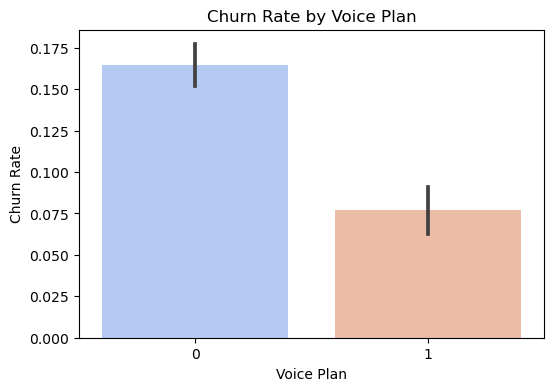

In [15]:
# Churn Rate by Voice Plan
plt.figure(figsize=(6, 4))
sns.barplot(x=df["voice.plan"], y=df["churn"], palette="coolwarm")
plt.title("Churn Rate by Voice Plan")
plt.xlabel("Voice Plan")
plt.ylabel("Churn Rate")
plt.show()

The chart shows that customers without a voice plan have a higher churn rate compared to those with a voice plan, indicating that the presence of a voice plan may positively impact customer retention.


Data Cleaning and Visualization Completed!

# Feature Engineering

In [17]:
# Calculate total minutes used across all call types
df['total_mins'] = df['day.mins'] + df['eve.mins'] + df['night.mins'] + df['intl.mins']

# Calculate total charges for all call types
df['total_charge'] = df['day.charge'] + df['eve.charge'] + df['night.charge'] + df['intl.charge']

# Calculate the ratio of day calls to day minutes to evaluate call efficiency
df['day_call_to_min_ratio'] = df['day.calls'] / df['day.mins']

# Replace infinite values with NaN for cases where day.mins is zero
df['day_call_to_min_ratio'].replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with zero where division by zero occurred
df['day_call_to_min_ratio'].fillna(0, inplace=True)

In [24]:
# Verify the unique values in 'voice.plan', 'intl.plan', and 'churn', 
# to ensure they are correctly encoded as 0 or 1 for model training.
print("Unique values in voice.plan:", df['voice.plan'].unique())
print("Unique values in intl.plan:", df['intl.plan'].unique())
print("Unique values in churn:", df['churn'].unique())

Unique values in voice.plan: [1 0]
Unique values in intl.plan: [0 1]
Unique values in churn: [0 1]


In [25]:
# Display dataframe information to confirm the structure and types of the data columns post-processing.
df.info

<bound method DataFrame.info of       account.length  voice.plan  voice.messages  intl.plan  intl.mins  \
0                128           1              25          0       10.0   
1                107           1              26          0       13.7   
2                137           0               0          0       12.2   
3                 84           0               0          1        6.6   
4                 75           0               0          1       10.1   
...              ...         ...             ...        ...        ...   
4995              50           1              40          0        9.9   
4996             152           0               0          0       14.7   
4997              61           0               0          0       13.6   
4998             109           0               0          0        8.5   
4999              86           1              34          0        9.3   

      intl.calls  intl.charge  day.mins  day.calls  day.charge  ...  \
0       

# Model Training

In [27]:
from sklearn.model_selection import train_test_split

# Splitting the Data

# Define features and target
X = df.drop('churn', axis=1)  # Use all columns except the target 'churn'
y = df['churn']  # The target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

**Training the Logistic Regression Model**

In [28]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Initialize the logistic regression model
model = LogisticRegression(max_iter=1000)

# Train the model
model.fit(X_train, y_train)

predict = model.predict(X_test)

C:\Users\misha\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [31]:
print(confusion_matrix(y_test, predict))
print(classification_report(y_test, predict))

[[1262   31]
 [ 159   48]]
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1293
           1       0.61      0.23      0.34       207

    accuracy                           0.87      1500
   macro avg       0.75      0.60      0.63      1500
weighted avg       0.85      0.87      0.85      1500



**Insights from Logistic Regression:**

Model performs well in predicting non-churn customers (high precision & recall for class 0).
Model struggles to correctly identify churn customers (low recall & F1-score for class 1).
Indicates the model favors predicting non-churn, missing many actual churn cases.
Useful as a baseline model for comparison with more complex models.


# Random Forest Model

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Initialize and train Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
rf_predict = rf_model.predict(X_test)

# Evaluate the Random Forest model
print("Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, rf_predict))

print("\nRandom Forest Classification Report:")
print(classification_report(y_test, rf_predict))


Random Forest Confusion Matrix:
[[1293    0]
 [  30  177]]

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1293
           1       1.00      0.86      0.92       207

    accuracy                           0.98      1500
   macro avg       0.99      0.93      0.96      1500
weighted avg       0.98      0.98      0.98      1500



**Insights from Random Forest Model:**

Overall accuracy is excellent (98%), significantly better than logistic regression.
High precision and recall for both churn (class 1) and non-churn (class 0), meaning the model detects both classes well.
Recall for churn (0.86) shows the model captures most actual churn cases, which is a major improvement.
Indicates Random Forest is well-suited for this dataset, handling both classes effectively.

# XGBoost Model

In [33]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Initialize and train XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on the test set
xgb_predict = xgb_model.predict(X_test)

# Evaluate the XGBoost model
print("XGBoost Confusion Matrix:")
print(confusion_matrix(y_test, xgb_predict))

print("\nXGBoost Classification Report:")
print(classification_report(y_test, xgb_predict))
# 

XGBoost Confusion Matrix:
[[1292    1]
 [  28  179]]

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1293
           1       0.99      0.86      0.93       207

    accuracy                           0.98      1500
   macro avg       0.99      0.93      0.96      1500
weighted avg       0.98      0.98      0.98      1500



**Insights from XGBoost Model:**

Overall accuracy (98%) matches Random Forest, showing strong overall performance.
Precision for churn (1) is excellent at 0.99, meaning very few false churn predictions.
Recall for churn (1) at 0.86 is very strong, meaning most actual churn cases are captured.
F1-score for churn is 0.93, showing great balance between precision and recall.
XGBoost handles both churn and non-churn well, making it a **very strong candidate for final model.**